<a href="https://colab.research.google.com/github/apallath/cats_vs_dogs_models/blob/main/cats_vs_dogs_layer_activations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Mount Google Drive
import os, shutil
from google.colab import drive
from google.colab import files
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
! pip install keract

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import models
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet import preprocess_input

import keract

# Fine-tuned VGG19 activations

In [4]:
model = load_model('/content/drive/MyDrive/colab_models/cats_vs_dogs_vgg19_fine_tuned.h5')
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Functional)           (None, 4, 4, 512)         20024384  
_________________________________________________________________
flatten (Flatten)            (None, 8192)              0         
_________________________________________________________________
dropout (Dropout)            (None, 8192)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               2097408   
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 257       
Total params: 22,122,049
Trainable params: 11,536,897
Non-trainable params: 10,585,152
_________________________________________________________________


In [5]:
model.layers[0].summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 150, 150, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 37, 37, 128)       0     

(150, 150, 3)


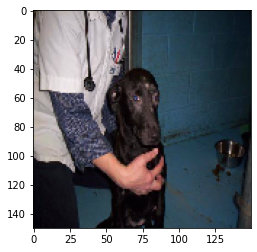

In [6]:
test_cats = '/content/drive/MyDrive/colab_data/cats_vs_dogs_small/test/cats'
test_dogs = '/content/drive/MyDrive/colab_data/cats_vs_dogs_small/test/dogs'

classes = ['Cat', 'Dog']

catsdogs = [test_cats, test_dogs]

true = np.random.randint(0, 2)

picked = catsdogs[true]
fnames = [os.path.join(picked, fname) for fname in os.listdir(picked)]
img_path = fnames[np.random.randint(0, 500)]
img = image.load_img(img_path, target_size=(150, 150))
x = image.img_to_array(img) / 255.0
print(x.shape)
plt.imshow(x)

In [7]:
lay_out = [layer.output for layer in model.layers[0].layers[1:]]
act_model = models.Model(inputs=model.layers[0].input, outputs=lay_out)

block1_conv1 (1, 150, 150, 64) 


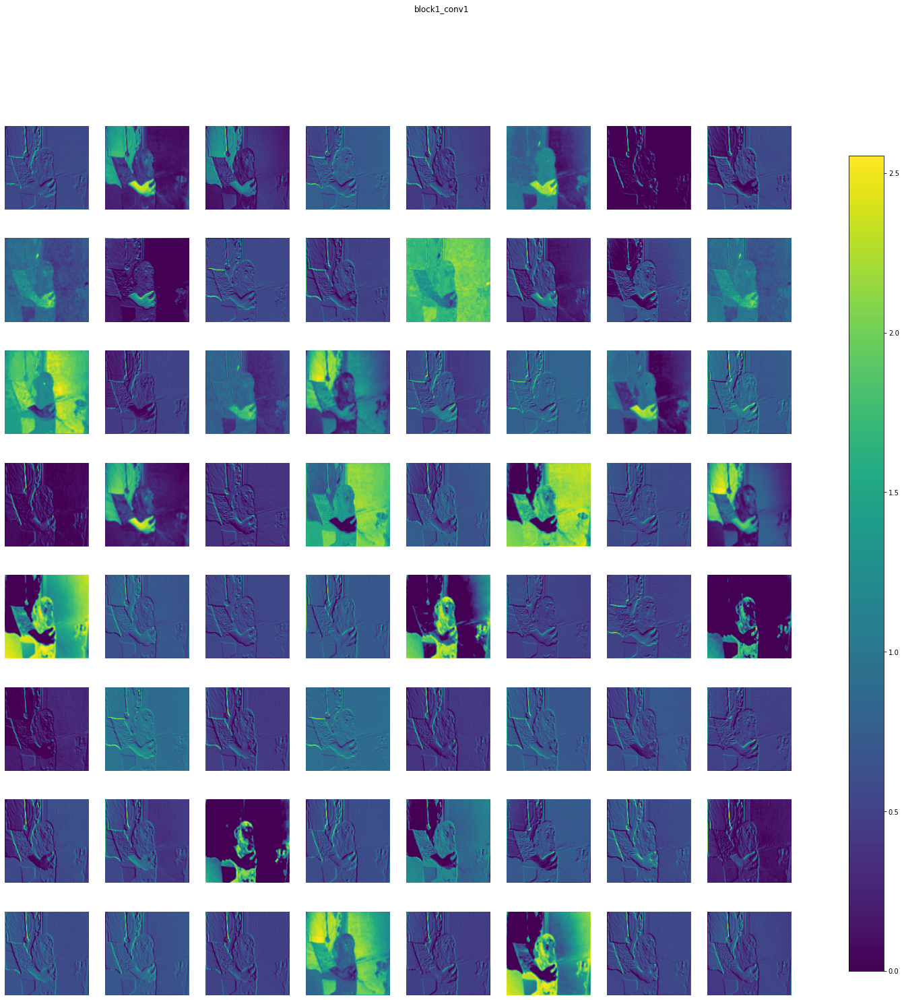

block2_conv1 (1, 75, 75, 128) 


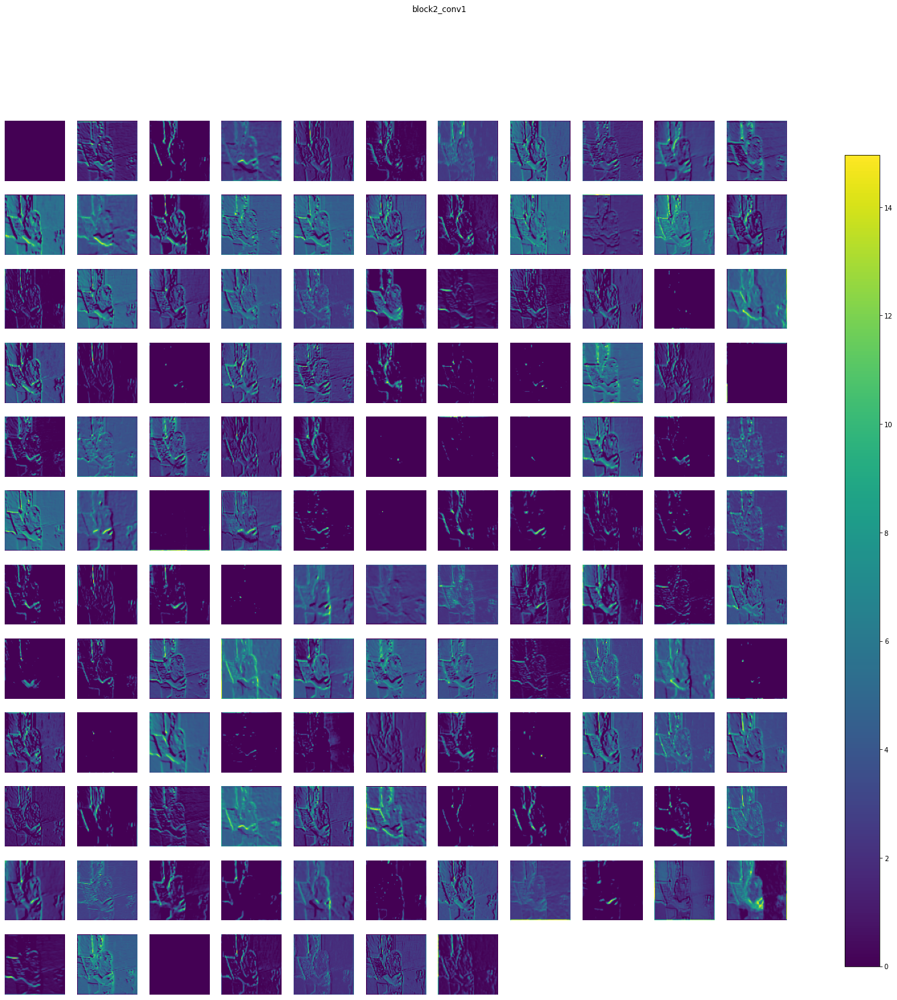

block3_conv1 (1, 37, 37, 256) 


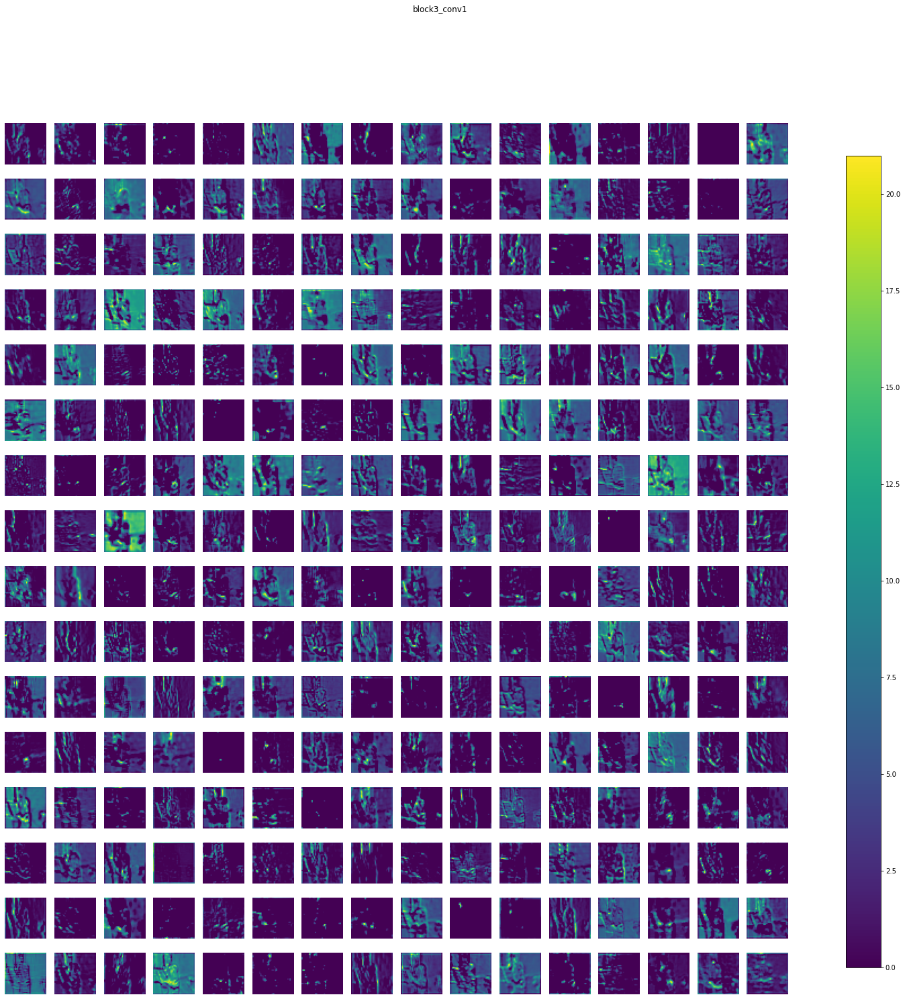

block4_conv1 (1, 18, 18, 512) 


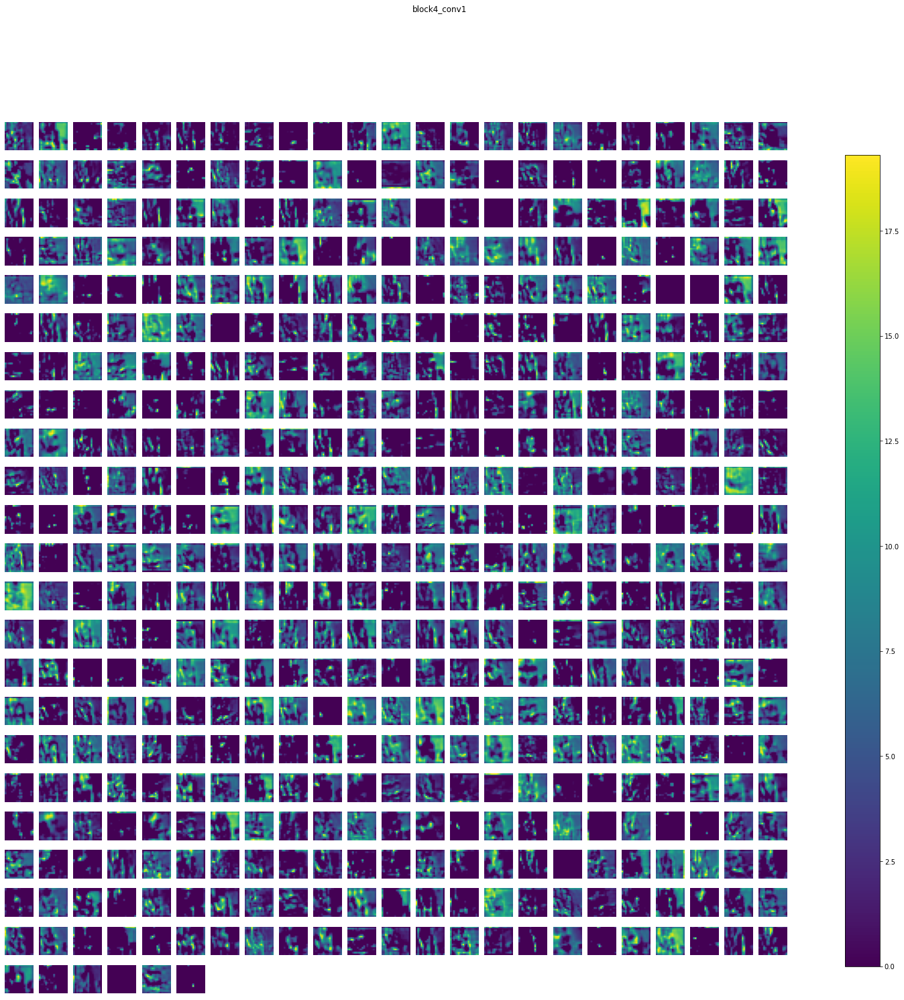

block5_conv1 (1, 9, 9, 512) 


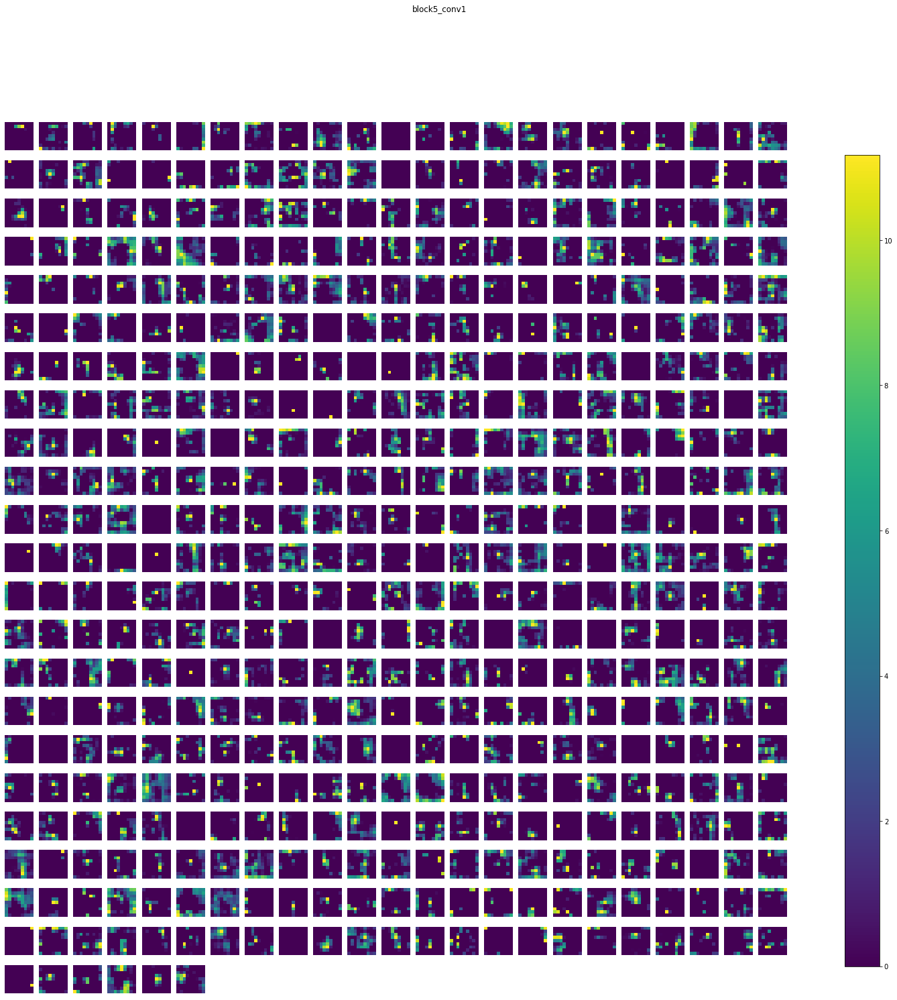

In [8]:
# Display selected layer activations with Keract
activations = keract.get_activations(act_model, x.reshape([1, 150, 150, 3]), layer_names=['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1'])
keract.display_activations(activations, cmap=None, save=False, data_format='channels_last', fig_size=(24, 24), reshape_1d_layers=False)

# Fine-tuned ResNet50 activations


In [9]:
model = load_model('/content/drive/MyDrive/colab_models/cats_vs_dogs_resnet50_fine_tuned.h5')
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 5, 5, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dropout (Dropout)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               524544    
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 257       
Total params: 24,112,513
Trainable params: 24,059,393
Non-trainable params: 53,120
_______________________________________

In [10]:
model.layers[0].summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 156, 156, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 75, 75, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 75, 75, 64)   256         conv1_conv[0][0]                 
___________________________________________________________________________________________

In [11]:
lay_out = [layer.output for layer in model.layers[0].layers[1:]]
act_model = models.Model(inputs=model.layers[0].input, outputs=lay_out)

conv2_block3_out (1, 38, 38, 256) 


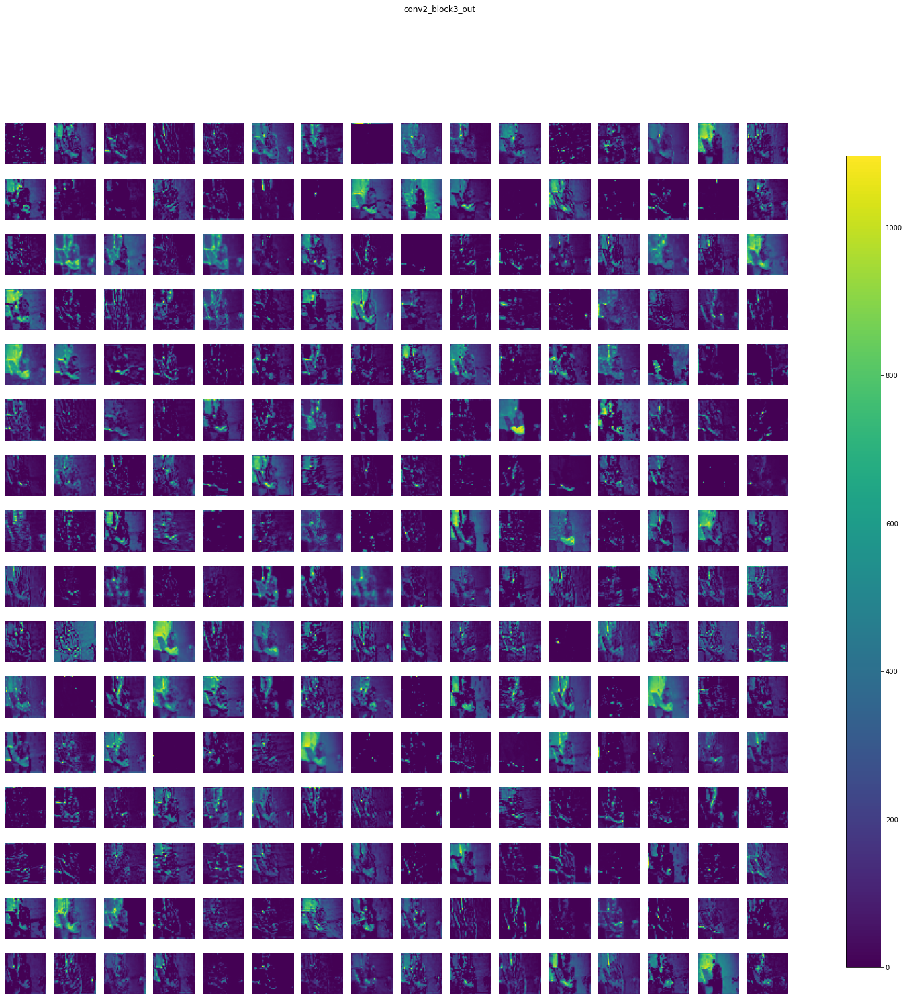

conv3_block4_out (1, 19, 19, 512) 


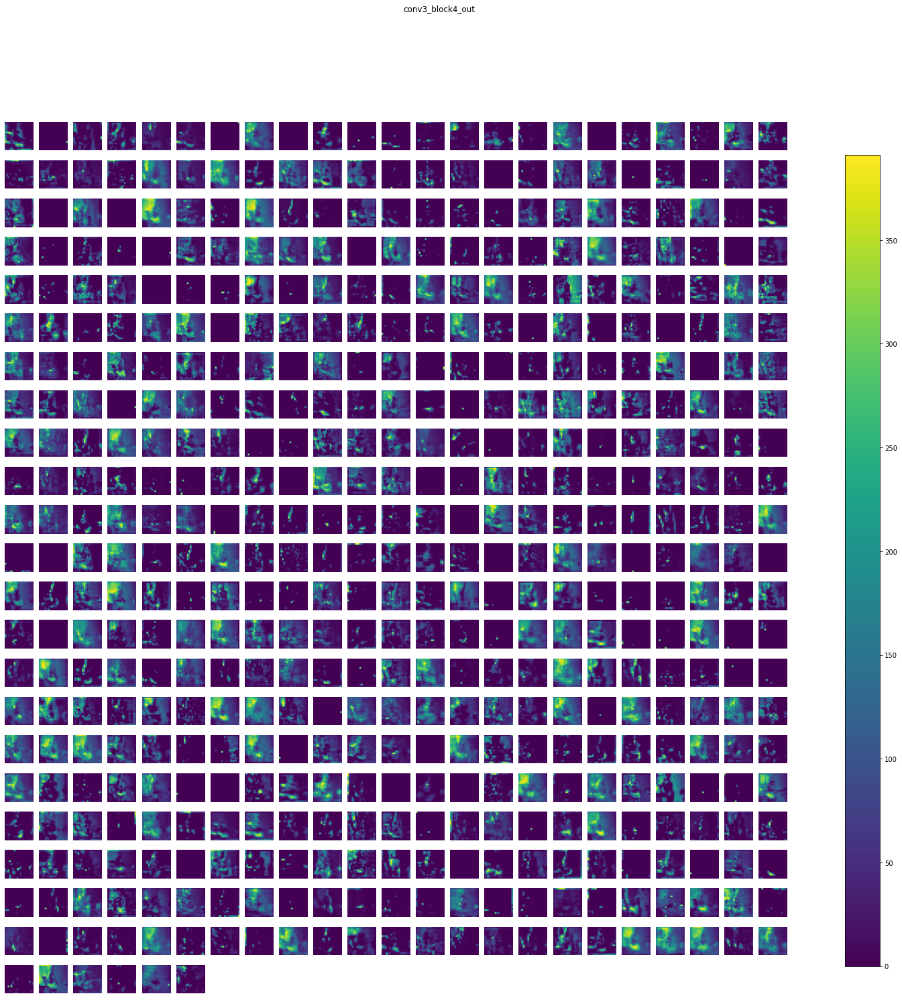

conv4_block6_out (1, 10, 10, 1024) 


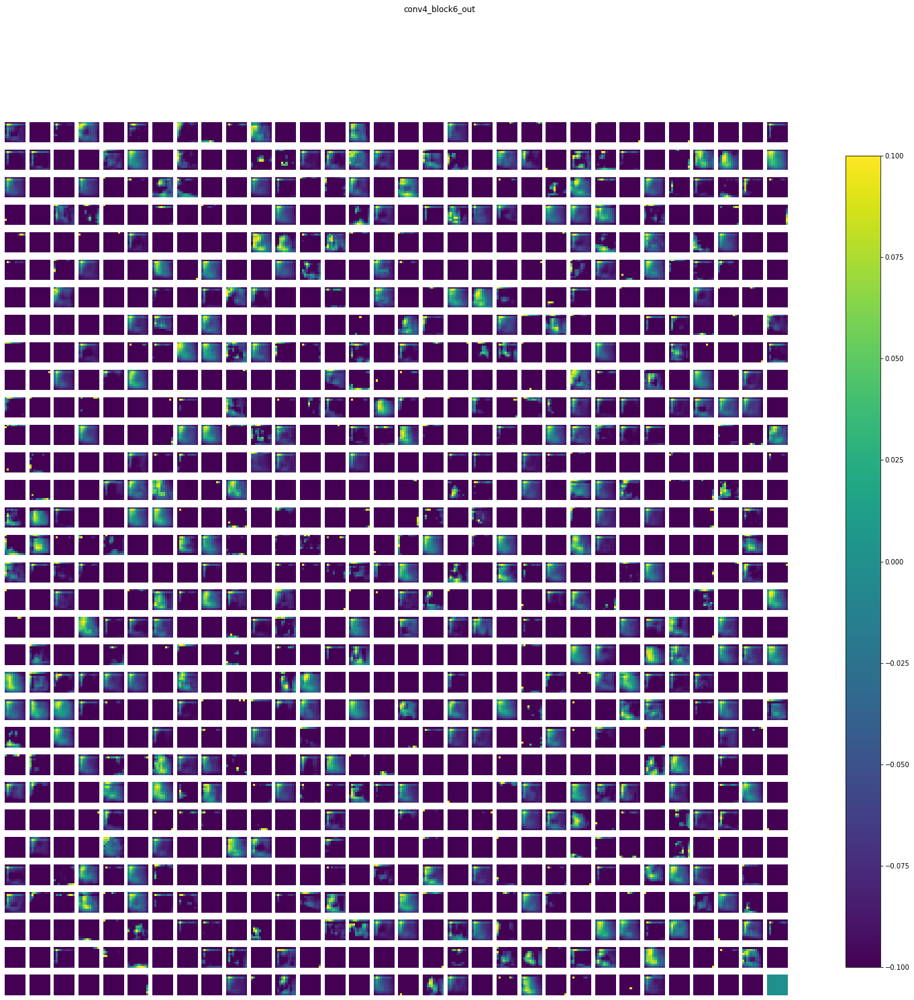

conv5_block3_out (1, 5, 5, 2048) 


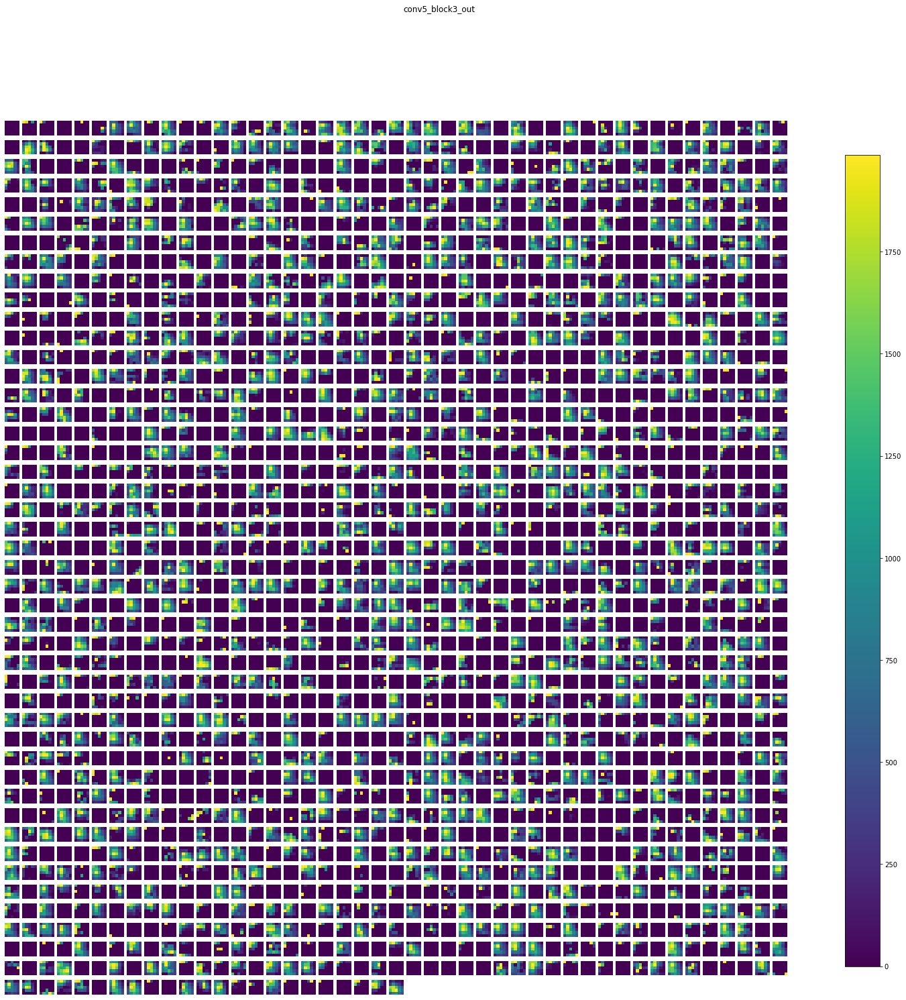

In [14]:
# Display Layer 1 activations with Keract
x = x * 255
x = preprocess_input(x)
activations = keract.get_activations(act_model, x.reshape([1, 150, 150, 3]), layer_names=['conv2_block3_out', 'conv3_block4_out', 'conv4_block6_out', 'conv5_block3_out'])
keract.display_activations(activations, cmap=None, save=False, data_format='channels_last', fig_size=(24, 24), reshape_1d_layers=False)